In [4]:
import numpy as np
import pandas as pd
import os
from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
import joblib

import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings
from IPython.display import display, HTML
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import numpy as np
import shap 
import lime# SHAP for explainability
from lime.lime_tabular import LimeTabularExplainer  # LIME for local explanations
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import pandas as pd
import time
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import random
import tensorflow as tf





# Configure Jupyter Notebook
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 500) 
pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

reload(plt) #ensures any changes made to matplotlib.pyplot during the session are applied.
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'
# pio.renderers.default = 'vscode'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis, 
#     layout_hovermode = 'closest',
#     layout_hoverdistance = -1,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
#     plot_bgcolor="white",
)
 
# pio.templates.default = 'seaborn+ck_template+gridon'
pio.templates.default = 'ck_template+gridon'
# pio.templates.default = 'seaborn+gridon'
# pio.templates

In [5]:

df0 = pd.read_csv('dataset/client_0_data.csv', low_memory=False)
df1 = pd.read_csv('dataset/client_1_data.csv', low_memory=False)
df2 = pd.read_csv('dataset/client_2_data.csv', low_memory=False)
df3 = pd.read_csv('dataset/client_3_data.csv', low_memory=False)
df4 = pd.read_csv('dataset/client_4_data.csv', low_memory=False)

In [6]:
from sklearn.model_selection import train_test_split

# Set test size and random state for reproducibility
test_size = 0.2
random_state = 42

# List of all client dataframes
client_data = [df0, df1, df2, df3, df4]

# Prepare training and testing sets for each client
client_train_data = {}
client_test_data = {}

for i, df in enumerate(client_data):
    print(f"\nProcessing Client {i+1}")
    
    # Separate features and target
    X = df.drop(columns=['Attack_type', 'Attack_label'])  # Features
    y = df['Attack_type']

    # Split each client's data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Store the processed data for each client
    client_train_data[i] = (X_train, y_train)
    client_test_data[i] = (X_test, y_test)

    # Print confirmation
    print(f"Completed processing for Client {i+1}")
    print(f"Training set size: {X_train.shape[0]}, Testing set size: {X_test.shape[0]}")



Processing Client 1
Completed processing for Client 1
Training set size: 724446, Testing set size: 181112

Processing Client 2
Completed processing for Client 2
Training set size: 229303, Testing set size: 57326

Processing Client 3
Completed processing for Client 3
Training set size: 94060, Testing set size: 23515

Processing Client 4
Completed processing for Client 4
Training set size: 345755, Testing set size: 86439

Processing Client 5
Completed processing for Client 5
Training set size: 134172, Testing set size: 33543


In [7]:

# ========== Set Random Seed ==========
seed = 42
np.random.seed(seed)
random.seed(seed)

# MLP Hyperparameters
hidden_layer_sizes = (20, 20)
batch_size = 2000
learning_rate = 0.001


# ========== Save models here ==========
models = {}

# ========== Train & Evaluate for Each Client ==========
for client_idx in range(5):
    

    X_train= client_train_data[client_idx][0]
    y_train = client_train_data[client_idx][1]
    X_test = client_test_data[client_idx][0]
    y_test = client_test_data[client_idx][1]

    # Create external/global test set (data from other clients)
    X_ext = pd.concat([client_test_data[j][0] for j in range(5) if j != client_idx], ignore_index=True)
    y_ext = pd.concat([client_test_data[j][1] for j in range(5) if j != client_idx], ignore_index=True)


    print(f"\n================ Client {client_idx} ================")
    
    # Initialize model for this client
    model = MLPClassifier(
        hidden_layer_sizes=hidden_layer_sizes,
        activation='relu',
        solver='adam',
        batch_size=batch_size,
        learning_rate_init=learning_rate,
        max_iter=1,
        warm_start=True,
        verbose=False,
        random_state=seed
    )
    
    # Train model (10 epochs)
    train_time = time.time()
    for epoch in range(11):
        model.fit(X_train, y_train)

    # Save model to dictionary
    models[client_idx] = model

    # -------- Local Test Evaluation --------
    y_pred_local = model.predict(X_test)
    acc_local = accuracy_score(y_test, y_pred_local)
    prec_local = precision_score(y_test, y_pred_local, average="weighted")
    rec_local = recall_score(y_test, y_pred_local, average="weighted")
    f1_local = f1_score(y_test, y_pred_local, average="weighted")

    print("\n--- Local Test Set ---")
    print(f"Accuracy: {acc_local:.4f}, Precision: {prec_local:.4f}, Recall: {rec_local:.4f}, F1: {f1_local:.4f}")
    
    # -------- Global/External Test Evaluation --------
    y_pred_global = model.predict(X_ext)
    acc_global = accuracy_score(y_ext, y_pred_global)
    prec_global = precision_score(y_ext, y_pred_global, average="weighted")
    rec_global = recall_score(y_ext, y_pred_global, average="weighted")
    f1_global = f1_score(y_ext, y_pred_global, average="weighted")

    print("\n--- Global Test Set (other clients) ---")
    print(f"Accuracy: {acc_global:.4f}, Precision: {prec_global:.4f}, Recall: {rec_global:.4f}, F1: {f1_global:.4f}")
    print(f"Training time: {time.time() - train_time:.2f} seconds")


================ Client 0 ================

--- Local Test Set ---
Accuracy: 0.9847, Precision: 0.9850, Recall: 0.9847, F1: 0.9834

--- Global Test Set (other clients) ---
Accuracy: 0.9443, Precision: 0.9620, Recall: 0.9443, F1: 0.9434
Training time: 30.31 seconds

================ Client 1 ================

--- Local Test Set ---
Accuracy: 0.9801, Precision: 0.9767, Recall: 0.9801, F1: 0.9752

--- Global Test Set (other clients) ---
Accuracy: 0.9281, Precision: 0.9195, Recall: 0.9281, F1: 0.9140
Training time: 9.53 seconds

================ Client 2 ================

--- Local Test Set ---
Accuracy: 0.8597, Precision: 0.8866, Recall: 0.8597, F1: 0.8447

--- Global Test Set (other clients) ---
Accuracy: 0.9510, Precision: 0.9570, Recall: 0.9510, F1: 0.9436
Training time: 3.91 seconds

================ Client 3 ================

--- Local Test Set ---
Accuracy: 0.9961, Precision: 0.9960, Recall: 0.9961, F1: 0.9954

--- Global Test Set (other clients) ---
Accuracy: 0.9270, Precision: 0.


================================ Client 0 Model Summary ================================

Generating SHAP explanations for the final local models...


100%|██████████| 100/100 [00:30<00:00,  3.28it/s]


SHAP values shape: (100, 67, 14)
X_explainer shape: (100, 67)
Number of classes: 14

2. Calculating feature importance percentages...
Mean absolute SHAP shape after processing: (67,)
Number of features: 67
Number of feature names: 67

Top 15 Features by Importance:
tcp.ack                       : 10.66%
encoder__dns.qry.name.len_0   : 9.15%
encoder__mqtt.protoname_0     : 8.22%
encoder__mqtt.conack.flags_0  : 7.60%
encoder__mqtt.topic_0         : 7.00%
tcp.seq                       : 5.48%
tcp.len                       : 4.11%
encoder__dns.qry.name.len_0.0 : 4.02%
encoder__http.request.version_0.0: 3.90%
encoder__http.request.version_0: 3.76%
http.response                 : 3.47%
encoder__http.request.method_0.0: 3.42%
encoder__mqtt.topic_0.0       : 2.97%
encoder__http.request.method_0: 2.72%
udp.stream                    : 2.66%

5 Least Important Features:
encoder__dns.qry.name.len_0.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.len_3.debian.pool.ntp.org: 0.00%
encoder__dns.qry.n

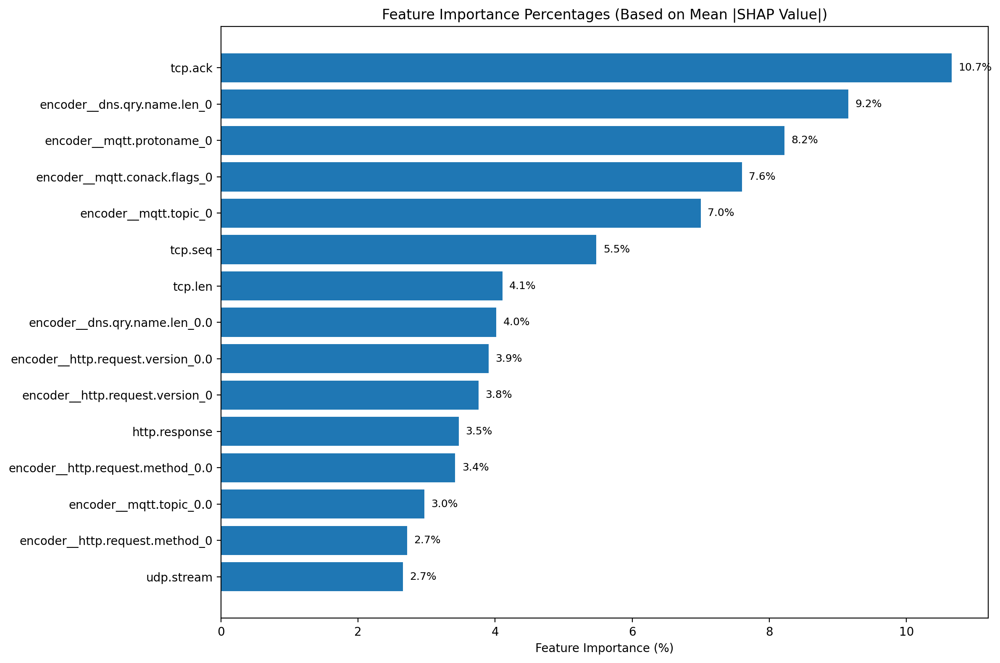


4. Generating SHAP bar plot...


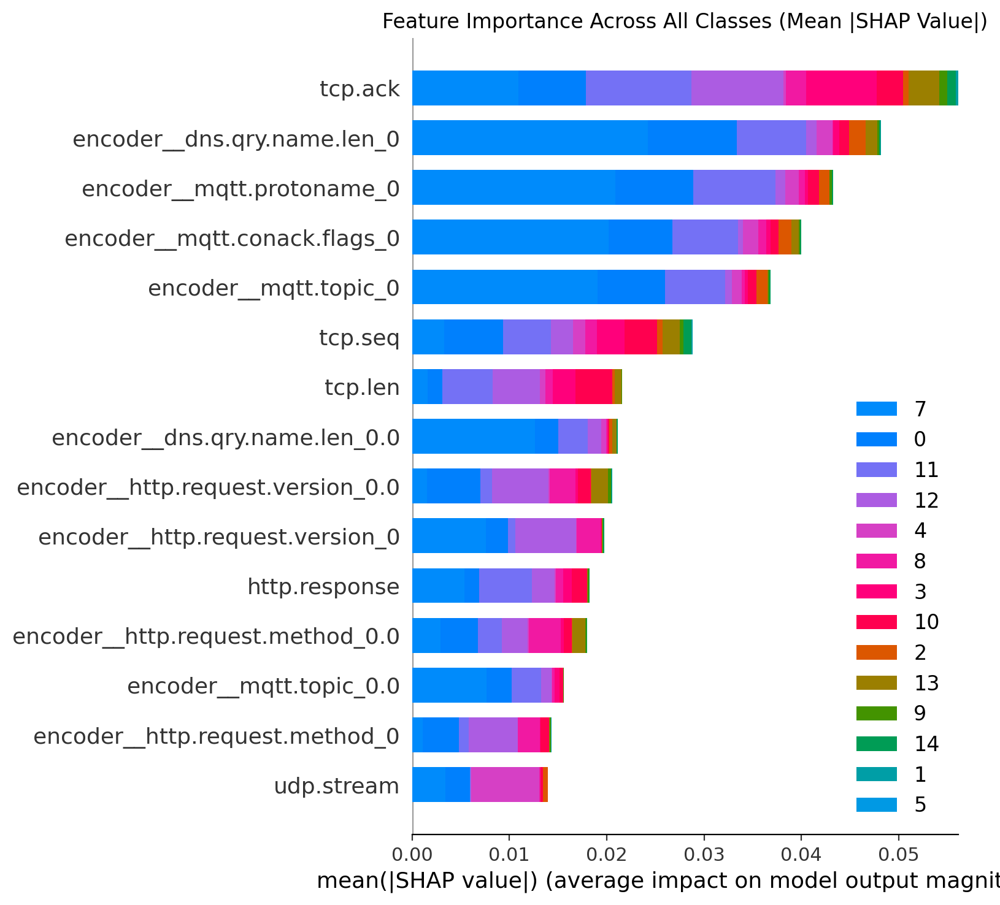


Summary:
Total features: 67
Top 5 features account for: 42.6% of total importance
Top 10 features account for: 63.9% of total importance
Bottom 5 features account for: 0.0% of total importance
Most important feature: tcp.ack (10.66%)
Least important feature: encoder__mqtt.conack.flags_- (0.00%)

================================ Client 1 Model Summary ================================

Generating SHAP explanations for the final local models...


100%|██████████| 100/100 [00:33<00:00,  3.00it/s]


SHAP values shape: (100, 67, 14)
X_explainer shape: (100, 67)
Number of classes: 14

2. Calculating feature importance percentages...
Mean absolute SHAP shape after processing: (67,)
Number of features: 67
Number of feature names: 67

Top 15 Features by Importance:
udp.stream                    : 11.29%
icmp.seq_le                   : 7.30%
encoder__dns.qry.name.len_0   : 7.00%
encoder__mqtt.conack.flags_0  : 6.61%
encoder__mqtt.protoname_0     : 6.46%
encoder__mqtt.topic_0         : 5.73%
tcp.flags                     : 5.31%
tcp.ack                       : 5.20%
encoder__http.referer_0       : 4.72%
tcp.connection.syn            : 4.33%
icmp.checksum                 : 3.93%
tcp.connection.rst            : 3.91%
encoder__http.request.method_0.0: 2.91%
tcp.flags.ack                 : 2.80%
encoder__http.request.version_0: 2.39%

5 Least Important Features:
encoder__dns.qry.name.len_0.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.len_3.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name

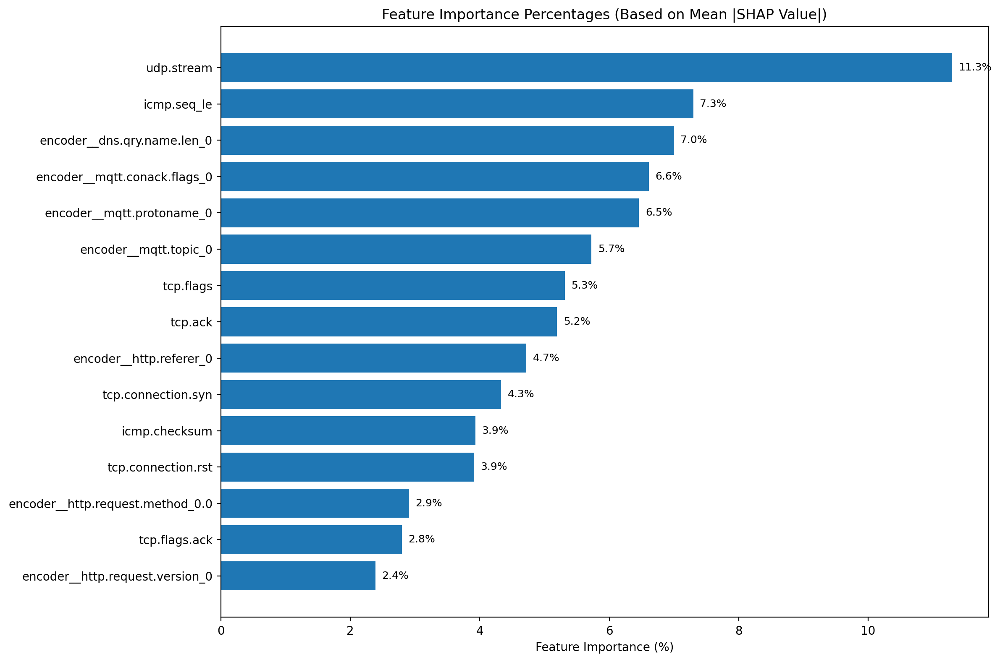


4. Generating SHAP bar plot...


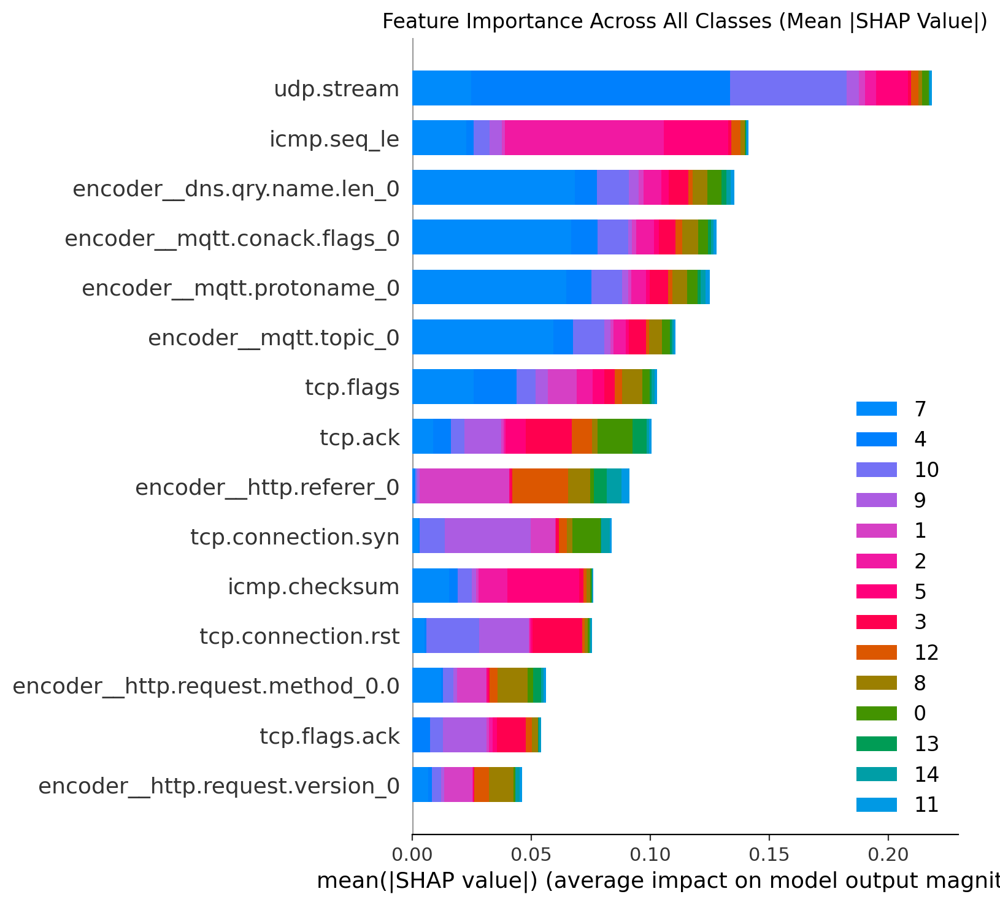


Summary:
Total features: 67
Top 5 features account for: 38.7% of total importance
Top 10 features account for: 64.0% of total importance
Bottom 5 features account for: 0.0% of total importance
Most important feature: udp.stream (11.29%)
Least important feature: encoder__mqtt.conack.flags_- (0.00%)

================================ Client 2 Model Summary ================================

Generating SHAP explanations for the final local models...


100%|██████████| 100/100 [00:32<00:00,  3.06it/s]


SHAP values shape: (100, 67, 15)
X_explainer shape: (100, 67)
Number of classes: 15

2. Calculating feature importance percentages...
Mean absolute SHAP shape after processing: (67,)
Number of features: 67
Number of feature names: 67

Top 15 Features by Importance:
encoder__http.referer_0       : 12.45%
icmp.seq_le                   : 10.35%
tcp.ack                       : 8.40%
tcp.connection.rst            : 8.38%
tcp.len                       : 6.16%
encoder__http.referer_0.0     : 5.74%
icmp.checksum                 : 5.02%
encoder__http.request.method_0.0: 4.72%
encoder__http.request.method_0: 4.66%
encoder__http.request.version_0: 4.60%
udp.stream                    : 3.98%
tcp.connection.syn            : 3.58%
encoder__http.request.version_0.0: 3.54%
tcp.flags                     : 3.18%
tcp.ack_raw                   : 2.48%

5 Least Important Features:
encoder__dns.qry.name.len_0.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.len_3.debian.pool.ntp.org: 0.00%
encoder__dns.qry.

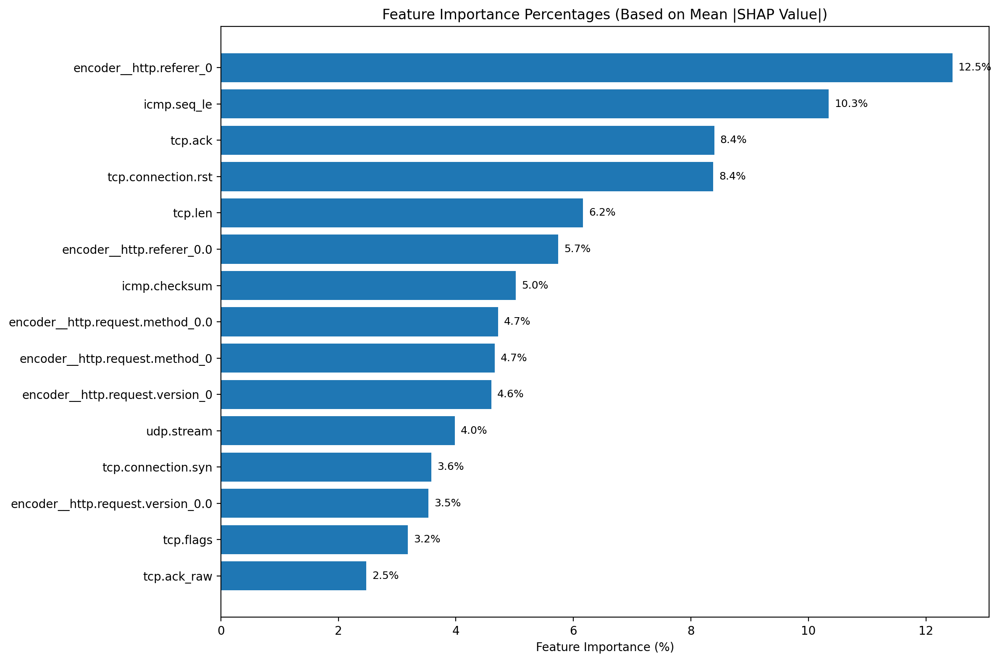


4. Generating SHAP bar plot...


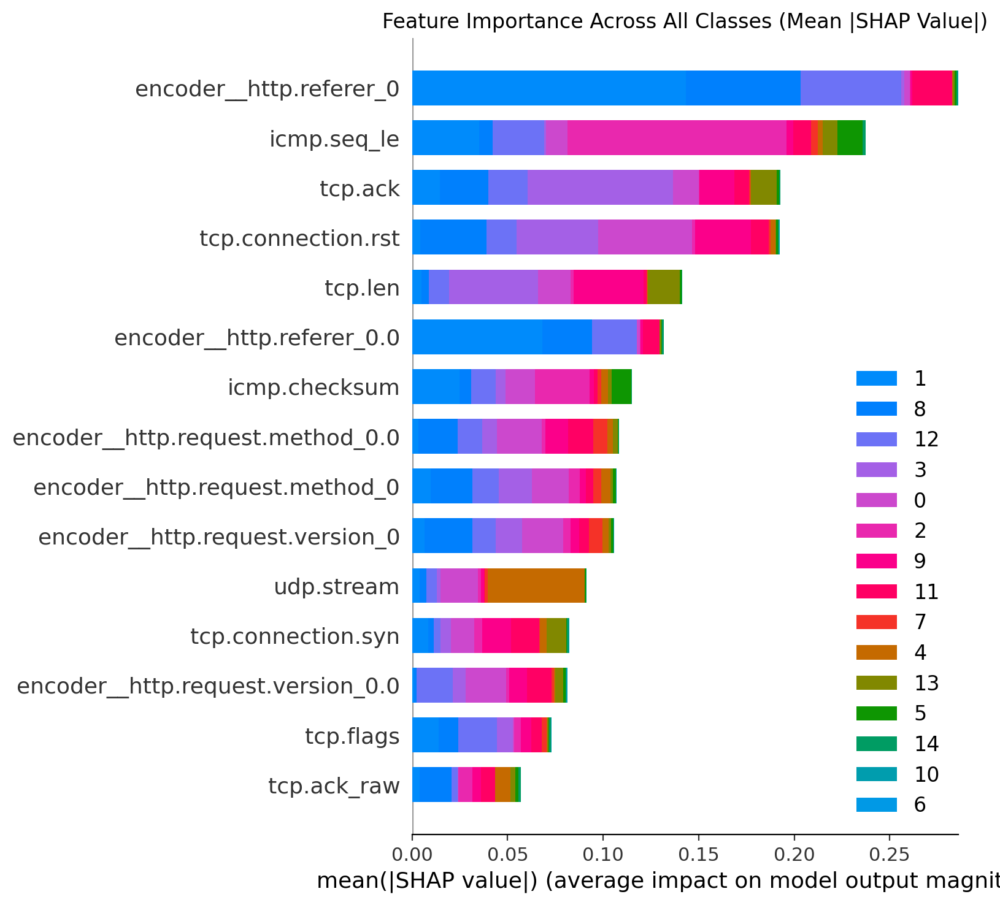


Summary:
Total features: 67
Top 5 features account for: 45.7% of total importance
Top 10 features account for: 70.5% of total importance
Bottom 5 features account for: 0.0% of total importance
Most important feature: encoder__http.referer_0 (12.45%)
Least important feature: encoder__mqtt.protoname_MQTT (0.00%)

================================ Client 3 Model Summary ================================

Generating SHAP explanations for the final local models...


100%|██████████| 100/100 [00:32<00:00,  3.04it/s]


SHAP values shape: (100, 67, 14)
X_explainer shape: (100, 67)
Number of classes: 14

2. Calculating feature importance percentages...
Mean absolute SHAP shape after processing: (67,)
Number of features: 67
Number of feature names: 67

Top 15 Features by Importance:
udp.stream                    : 14.93%
encoder__mqtt.conack.flags_0  : 9.76%
encoder__mqtt.protoname_0     : 8.98%
tcp.ack                       : 7.77%
encoder__mqtt.topic_0         : 7.62%
encoder__dns.qry.name.len_0   : 7.61%
tcp.flags.ack                 : 6.32%
tcp.len                       : 6.03%
tcp.checksum                  : 2.78%
tcp.connection.syn            : 2.66%
tcp.connection.rst            : 2.55%
tcp.ack_raw                   : 2.17%
encoder__http.referer_0       : 2.01%
encoder__http.referer_0.0     : 1.87%
encoder__mqtt.topic_0.0       : 1.79%

5 Least Important Features:
encoder__dns.qry.name.len_0.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.len_3.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.le

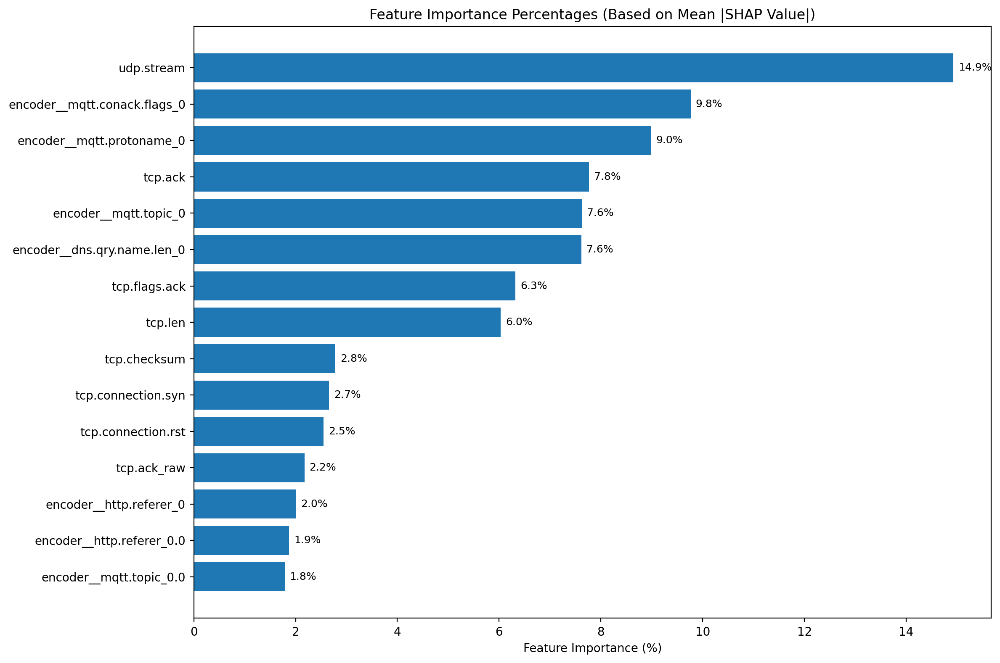


4. Generating SHAP bar plot...


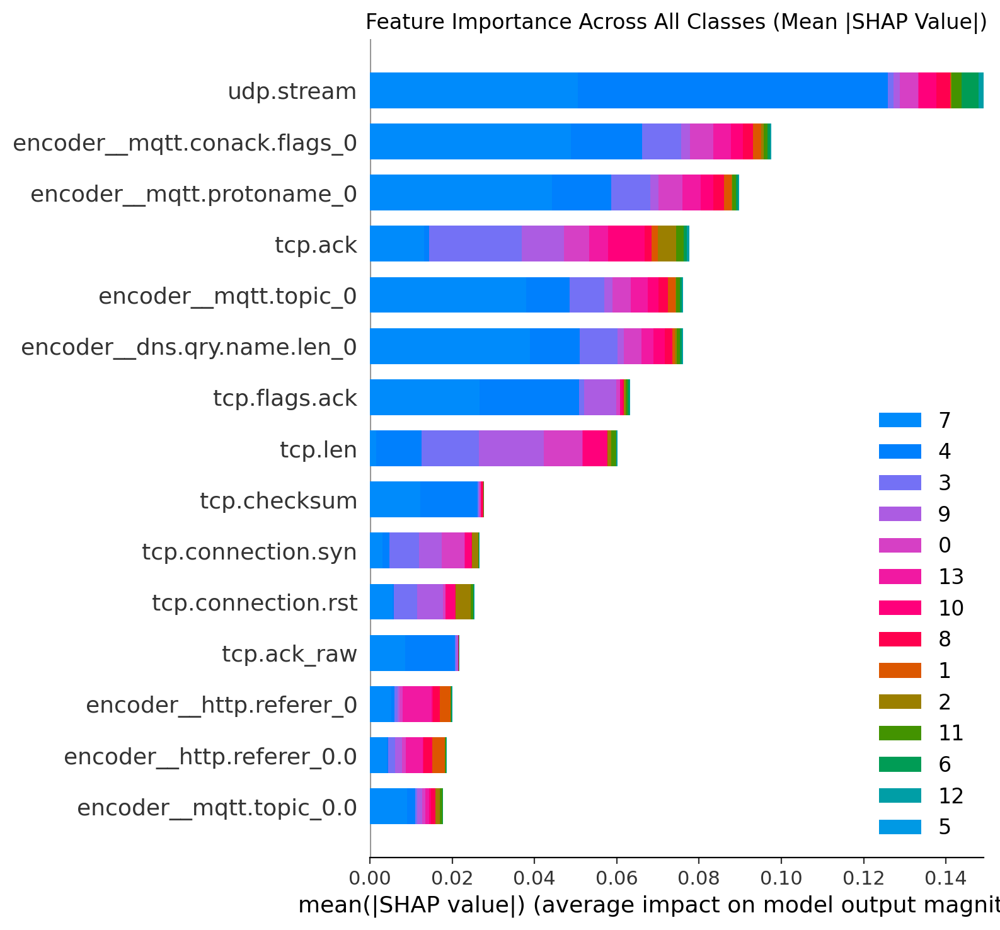


Summary:
Total features: 67
Top 5 features account for: 49.1% of total importance
Top 10 features account for: 74.5% of total importance
Bottom 5 features account for: 0.0% of total importance
Most important feature: udp.stream (14.93%)
Least important feature: encoder__mqtt.conack.flags_- (0.00%)

================================ Client 4 Model Summary ================================

Generating SHAP explanations for the final local models...


100%|██████████| 100/100 [00:35<00:00,  2.83it/s]


SHAP values shape: (100, 67, 15)
X_explainer shape: (100, 67)
Number of classes: 15

2. Calculating feature importance percentages...
Mean absolute SHAP shape after processing: (67,)
Number of features: 67
Number of feature names: 67

Top 15 Features by Importance:
icmp.seq_le                   : 10.44%
tcp.ack                       : 8.62%
tcp.len                       : 7.22%
tcp.seq                       : 7.21%
encoder__http.referer_0       : 7.11%
encoder__http.referer_0.0     : 6.47%
encoder__dns.qry.name.len_0   : 5.84%
encoder__mqtt.conack.flags_0  : 5.79%
encoder__mqtt.topic_0         : 5.37%
encoder__mqtt.protoname_0     : 4.97%
icmp.checksum                 : 4.45%
encoder__http.request.method_0.0: 3.58%
tcp.connection.rst            : 2.16%
udp.stream                    : 1.92%
http.response                 : 1.82%

5 Least Important Features:
encoder__dns.qry.name.len_0.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.len_3.debian.pool.ntp.org: 0.00%
encoder__dns.qry.name.

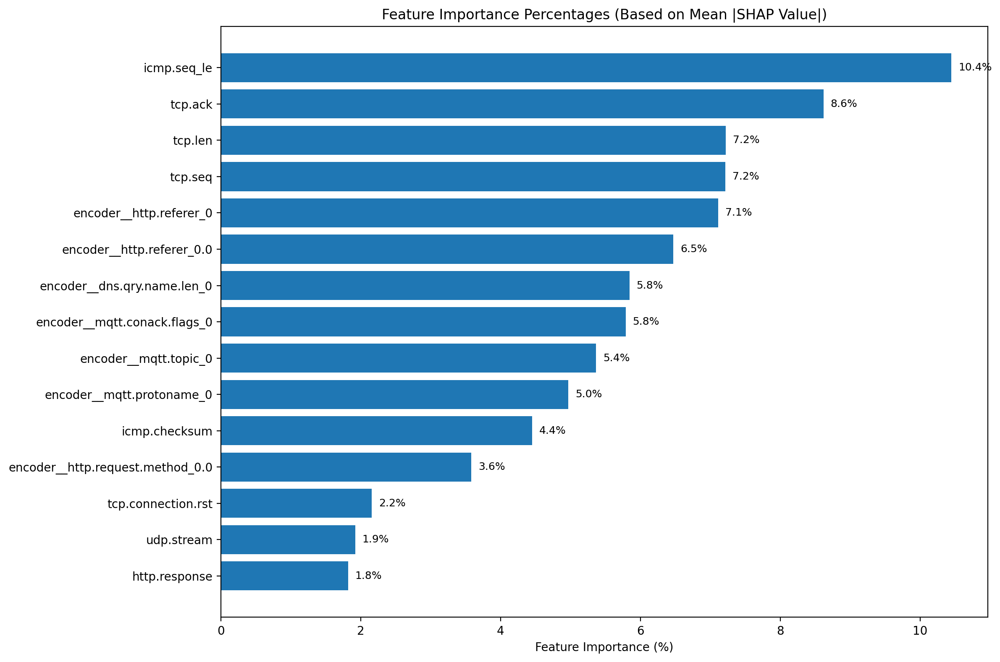


4. Generating SHAP bar plot...


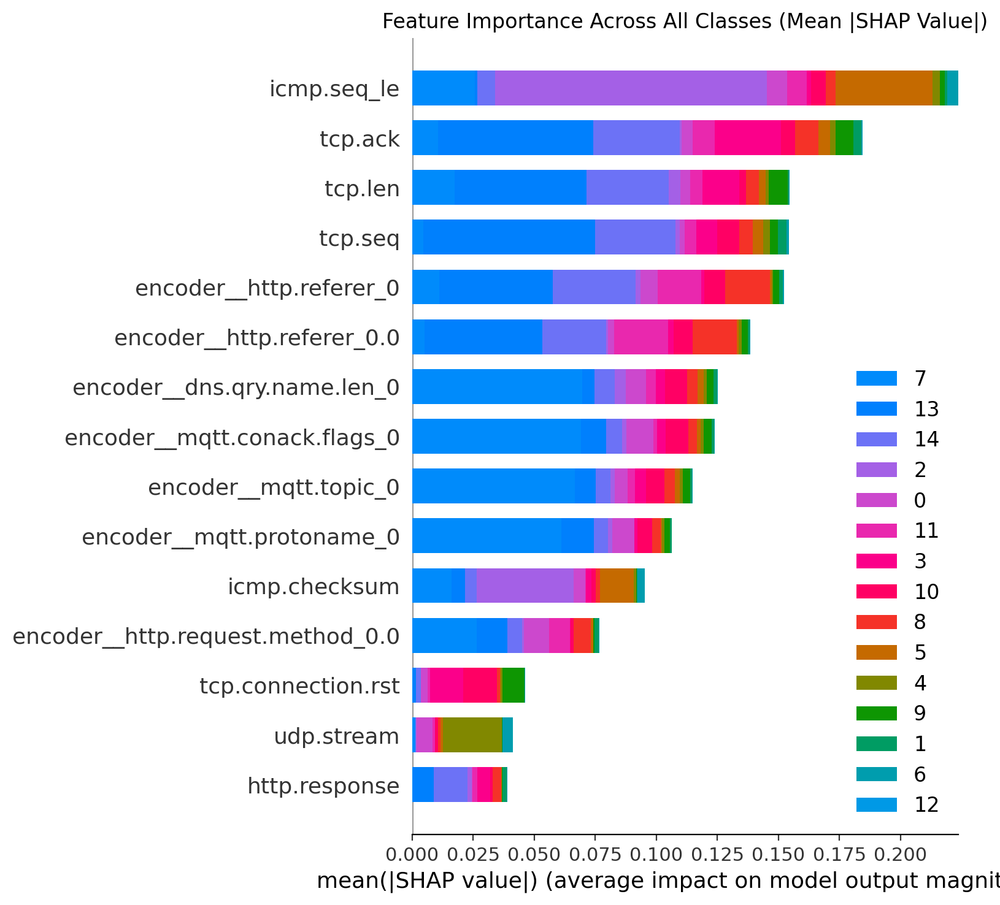


Summary:
Total features: 67
Top 5 features account for: 40.6% of total importance
Top 10 features account for: 69.0% of total importance
Bottom 5 features account for: 0.0% of total importance
Most important feature: icmp.seq_le (10.44%)
Least important feature: encoder__mqtt.conack.flags_- (0.00%)


In [8]:
for client_idx in range(5):
    print(f"\n================================ Client {client_idx} Model Summary ================================")
    X_train= client_train_data[client_idx][0]
    y_train = client_train_data[client_idx][1]
    X_test = client_test_data[client_idx][0]
    y_test = client_test_data[client_idx][1]
    model  = models[client_idx]

    print(f"\nGenerating SHAP explanations for the final local models...")

    X_explainer = X_test.values[:100]
    # X_explainer = X_test.values[:50]  # Subset of test data

    # Select a representative background set (e.g., 100 samples)
    background = shap.sample(X_train, 100) if len(X_train) > 100 else X_train

    # Initialize the SHAP KernelExplainer
    explainer = shap.KernelExplainer(model.predict_proba, background)

    # Compute SHAP values for the explanation set
    shap_values = explainer.shap_values(X_explainer)

    print(f"SHAP values shape: {[sv.shape for sv in shap_values] if isinstance(shap_values, list) else shap_values.shape}")
    print(f"X_explainer shape: {X_explainer.shape}")
    print(f"Number of classes: {len(model.classes_)}")

    # # 1. Multi-class summary plot (shows all classes together)
    # print("\n1. Generating multi-class summary plot...")
    # shap.summary_plot(shap_values, X_explainer, feature_names=X_test.columns, 
    #                   class_names=model.classes_)

    # 2. Calculate feature importance percentages
    print("\n2. Calculating feature importance percentages...")

    # Handle SHAP values based on their structure
    if isinstance(shap_values, list):
        # Multi-class case: shap_values is a list of arrays, one per class
        # Each array has shape (n_samples, n_features)
        mean_abs_shap = np.mean([np.abs(sv).mean(axis=0) for sv in shap_values], axis=0)
    elif len(shap_values.shape) == 3:
        # Multi-class case: shap_values has shape (n_samples, n_features, n_classes)
        # Average across samples (axis=0) and classes (axis=2)
        mean_abs_shap = np.abs(shap_values).mean(axis=(0, 2))
    else:
        # Binary classification case: shape (n_samples, n_features)
        mean_abs_shap = np.abs(shap_values).mean(axis=0)

    print(f"Mean absolute SHAP shape after processing: {mean_abs_shap.shape}")

    # Calculate percentages
    total_importance = np.sum(mean_abs_shap)
    feature_importance_pct = (mean_abs_shap / total_importance) * 100

    # Get feature names - use the actual column names from X_test
    feature_names = list(X_test.columns)
    n_features = len(mean_abs_shap)

    print(f"Number of features: {n_features}")
    print(f"Number of feature names: {len(feature_names)}")

    # Ensure feature names match the number of features
    if len(feature_names) != n_features:
        print(f"Error: Feature names length ({len(feature_names)}) doesn't match SHAP values length ({n_features})")
        # Use available feature names or create generic ones
        if len(feature_names) > n_features:
            feature_names = feature_names[:n_features]
        else:
            feature_names.extend([f'feature_{i}' for i in range(len(feature_names), n_features)])

    # Create DataFrame for easier handling
    importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': mean_abs_shap,
        'percentage': feature_importance_pct
    }).sort_values('importance', ascending=False)

    # Display top features with percentages
    print("\nTop 15 Features by Importance:")
    print("=" * 50)
    for idx, row in importance_df.head(15).iterrows():
        print(f"{row['feature']:<30}: {row['percentage']:.2f}%")

    # Display least important features
    print("\n5 Least Important Features:")
    print("=" * 50)
    for idx, row in importance_df.tail(5).iterrows():
        print(f"{row['feature']:<30}: {row['percentage']:.2f}%")

    # 3. Bar plot with percentages
    print("\n3. Generating feature importance bar plot with percentages...")
    plt.figure(figsize=(12, 8))

    # Get top 15 features for plotting
    top_features = importance_df.head(15)

    # Create horizontal bar plot
    bars = plt.barh(range(len(top_features)), top_features['percentage'])
    plt.yticks(range(len(top_features)), top_features['feature'])
    plt.xlabel('Feature Importance (%)')
    plt.title('Feature Importance Percentages (Based on Mean |SHAP Value|)')

    # Add percentage labels on bars
    for i, (bar, pct) in enumerate(zip(bars, top_features['percentage'])):
        plt.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2, 
                f'{pct:.1f}%', va='center', fontsize=9)

    plt.gca().invert_yaxis()  # Highest importance at top
    plt.tight_layout()
    plt.show()

    # 4. Alternative: Use SHAP's built-in bar plot but create custom percentage display
    print("\n4. Generating SHAP bar plot...")
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values, X_explainer, plot_type="bar",
                    feature_names=feature_names, class_names=model.classes_,
                    max_display=15, show=False)
    plt.title("Feature Importance Across All Classes (Mean |SHAP Value|)")

    # Add percentage text to the current plot
    ax = plt.gca()
    bars = ax.patches
    # if len(bars) > 0:
    #     # Get the importance values from the bars
    #     bar_values = [bar.get_width() for bar in bars]
    #     total_bar_value = sum(bar_values)
        
    #     # Add percentage labels
    #     for bar in bars:
    #         width = bar.get_width()
    #         percentage = (width / total_bar_value) * 100
    #         ax.text(width + max(bar_values) * 0.01, bar.get_y() + bar.get_height()/2,
    #                 f'{percentage:.1f}%', va='center', fontsize=8)

    plt.tight_layout()
    plt.show()

    # 5. Print summary statistics
    print(f"\nSummary:")
    print(f"Total features: {len(importance_df)}")
    print(f"Top 5 features account for: {importance_df.head(5)['percentage'].sum():.1f}% of total importance")
    print(f"Top 10 features account for: {importance_df.head(10)['percentage'].sum():.1f}% of total importance")
    print(f"Bottom 5 features account for: {importance_df.tail(5)['percentage'].sum():.1f}% of total importance")
    print(f"Most important feature: {importance_df.iloc[0]['feature']} ({importance_df.iloc[0]['percentage']:.2f}%)")
    print(f"Least important feature: {importance_df.iloc[-1]['feature']} ({importance_df.iloc[-1]['percentage']:.2f}%)")

In [ ]:

for client_idx in range(5):
    print(f"\n================================ Client {client_idx} Model Summary ================================")
    X_train= client_train_data[client_idx][0]
    y_train = client_train_data[client_idx][1]
    X_test = client_test_data[client_idx][0]
    y_test = client_test_data[client_idx][1]

    model  = models[client_idx]
    # === LIME Explainability for Centralized Model (Optimized) ===
    print(f"\nGenerating LIME explanations for a sample prediction...")

    try:
        # Define LIME Explainer
        lime_explainer = LimeTabularExplainer(
            training_data=X_train.values,
            feature_names=X_train.columns.tolist(),
            class_names=[str(cls) for cls in np.unique(y_test)],
            mode="classification"
        )
        
        # Generate explanation for a sample instance
        sample_idx = # random sample from this client
        sample_instance = X_test.iloc[sample_idx].values
        
        # Get predicted class first
        predicted_class = model.predict([sample_instance])[0]
        
        # Generate explanation - focused on predicted class only
        explanation = lime_explainer.explain_instance(
            sample_instance,
            model.predict_proba,
            num_features=10,  # Show only top 10 most important features
            top_labels=1      # Show only the predicted class (top 1)
        )
        
        # Display explanation in notebook (will show only predicted class)
        explanation.show_in_notebook(show_table=True)
        
        
        # Print prediction details
        print(f"\nActual label: {y_test.iloc[sample_idx]}")
        print(f"Predicted label: {predicted_class}")
        
        # Get prediction probabilities
        pred_proba = model.predict_proba([sample_instance])[0]
        print(f"Prediction probability for class {predicted_class}: {pred_proba[predicted_class]:.4f}")
        
        # Get feature importance for the predicted class only
        exp_list = explanation.as_list(label=predicted_class)
        print(f"\nTop {min(10, len(exp_list))} feature contributions for predicted class {predicted_class}:")
        print("-" * 60)
        for i, (feature, importance) in enumerate(exp_list[:10], 1):
            direction = "↑" if importance > 0 else "↓"
            print(f"{i:2d}. {feature}: {importance:+.4f} {direction}")
        
        # Optional: Create a simple bar chart of feature importance
        print(f"\nFeature Importance Visualization:")
        print("-" * 60)
        max_abs_importance = max(abs(imp) for _, imp in exp_list[:10])
        
        for feature, importance in exp_list[:10]:
            # Create a simple text-based bar chart
            bar_length = int(abs(importance) / max_abs_importance * 20)
            bar = "█" * bar_length
            if importance >= 0:
                print(f"{feature:25s} |{bar:>20s} (+{importance:.3f})")
            else:
                print(f"{feature:25s} |{bar:>20s} ({importance:.3f})")
            
    except Exception as e:
        print(f"Error generating LIME explanation: {e}")
        print("Make sure you have:")
        print("- X_train, X_test, y_test defined")
        print("- A trained model with predict_proba method")
        print("- LIME library installed: pip install lime")

    # === Alternative: Generate explanation for multiple samples ===
    print(f"\n" + "="*80)
    print("BONUS: Quick explanations for multiple samples")
    print("="*80)


    # num is random sample from each client
    for idx in range(5):
        if idx != client_idx:
            sample = client_test_data[client_idx][0].iloc[num].values
            pred_class = model.predict([sample])[0]
            actual_class = client_test_data[idx][1].iloc[num]
            
            # Quick explanation with fewer features
            exp = lime_explainer.explain_instance(
                sample, 
                model.predict_proba, 
                num_features=5,  # Top 5 features only
                top_labels=1
            )
            
            exp_list = exp.as_list(label=pred_class) # error happens here because of the indices
            
            print(f"\nSample {num}: Actual={actual_class}, Predicted={pred_class}")
            print("Top 5 features:")
            for feature, importance in exp_list[:5]:
                print(f"  • {feature}: {importance:+.3f}")
            



================================ Client 0 Model Summary ================================

Generating LIME explanations for a sample prediction...



Actual label: 7
Predicted label: 7
Prediction probability for class 7: 0.0000
Error generating LIME explanation: np.int64(7)
Make sure you have:
- X_train, X_test, y_test defined
- A trained model with predict_proba method
- LIME library installed: pip install lime

BONUS: Quick explanations for multiple samples


KeyError: np.int64(7)

In [17]:
samples = []
np.random.seed(42)

for client_idx in range(5):
    num = np.random.randint(len(client_test_data[client_idx][0]))
    samples.append(num)


for client_idx in range(5):
    print(f"\n================================ Client {client_idx} Model Summary ================================")
    X_train = client_train_data[client_idx][0]
    y_train = client_train_data[client_idx][1]
    X_test = client_test_data[client_idx][0]
    y_test = client_test_data[client_idx][1]

    model = models[client_idx]

    print(f"\nGenerating LIME explanations for a sample prediction...")

    try:
        lime_explainer = LimeTabularExplainer(
            training_data=X_train.values,
            feature_names=X_train.columns.tolist(),
            class_names=[str(cls) for cls in np.unique(y_test)],
            mode="classification"
        )

        # Sample one instance from this client's test set
        sample_idx = samples[client_idx] 
        sample_instance = X_test.iloc[sample_idx].values
        predicted_class = model.predict([sample_instance])[0]

        explanation = lime_explainer.explain_instance(
            sample_instance,
            model.predict_proba,
            num_features=10,
            top_labels=1
        )

        explanation.show_in_notebook(show_table=True)

        print(f"\nActual label: {y_test.iloc[sample_idx]}")
        print(f"Predicted label: {predicted_class}")
        pred_proba = model.predict_proba([sample_instance])[0]
        print(f"Prediction probability for class {predicted_class}: {pred_proba[predicted_class]:.4f}")

        exp_list = explanation.as_list(label=predicted_class)
        print(f"\nTop {min(10, len(exp_list))} feature contributions:")
        print("-" * 60)
        for i, (feature, importance) in enumerate(exp_list[:10], 1):
            direction = "↑" if importance > 0 else "↓"
            print(f"{i:2d}. {feature}: {importance:+.4f} {direction}")

        print(f"\nFeature Importance Visualization:")
        print("-" * 60)
        max_abs_importance = max(abs(imp) for _, imp in exp_list[:10])
        for feature, importance in exp_list[:10]:
            bar_length = int(abs(importance) / max_abs_importance * 20)
            bar = "█" * bar_length
            print(f"{feature:25s} |{bar:>20s} ({importance:+.3f})")

    except Exception as e:
        print(f"Error generating LIME explanation: {e}")
        print("- Ensure X_train/X_test/y_test are defined")
        print("- Model must support predict_proba")
        print("- Install LIME with: pip install lime")

    # === BONUS: Multiple Sample Explanations ===
    print(f"\n{'='*80}")
    print("BONUS: Quick explanations for multiple samples")
    print(f"{'='*80}")

    for idx in range(5):
        if idx != client_idx:
            try:
                num = samples[idx]
                sample = client_test_data[idx][0].iloc[num].values
                actual_class = client_test_data[idx][1].iloc[num]
                pred_class = model.predict([sample])[0]

                exp = lime_explainer.explain_instance(
                    sample,
                    model.predict_proba,
                    num_features=5,
                    top_labels=1
                )

                top_label = exp.top_labels[0]
                exp_list = exp.as_list(label=top_label)

                print(f"\nSample {num} from Client {idx}: Actual={actual_class}, Predicted={pred_class}")
                print("Top 5 features:")
                for feature, importance in exp_list[:5]:
                    print(f"  • {feature}: {importance:+.3f}")
            except Exception as e:
                print(f"Error explaining sample from Client {idx}: {e}")



================================ Client 0 Model Summary ================================

Generating LIME explanations for a sample prediction...



Actual label: 7
Predicted label: 7
Prediction probability for class 7: 0.0000
Error generating LIME explanation: np.int64(7)
- Ensure X_train/X_test/y_test are defined
- Model must support predict_proba
- Install LIME with: pip install lime

BONUS: Quick explanations for multiple samples

Sample 15795 from Client 1: Actual=1, Predicted=1
Top 5 features:
  • encoder__http.referer_0 > 0.00: +0.025
  • encoder__http.request.version_0 > 0.00: +0.003
  • encoder__http.request.method_0 > 0.00: +0.003
  • encoder__mqtt.topic_0.0 > 0.00: +0.002
  • encoder__mqtt.conack.flags_0.0 > 0.00: +0.002

Sample 860 from Client 2: Actual=4, Predicted=4
Top 5 features:
  • dns.qry.name > -0.08: +0.161
  • udp.stream > -0.26: +0.089
  • tcp.connection.fin <= -0.34: -0.031
  • mqtt.topic_len <= -0.21: -0.019
  • tcp.seq <= -0.60: +0.009

Sample 76820 from Client 3: Actual=7, Predicted=7
Top 5 features:
  • http.response <= -0.13: +0.293
  • tcp.connection.rst <= -0.22: +0.161
  • -0.69 < tcp.ack <= -0.45: 


Actual label: 1
Predicted label: 1
Prediction probability for class 1: 0.9879

Top 10 feature contributions:
------------------------------------------------------------
 1. encoder__http.referer_0 > 0.00: +0.0058 ↑
 2. encoder__http.request.version_0 > 0.00: +0.0037 ↑
 3. tcp.connection.synack <= -0.23: -0.0029 ↓
 4. tcp.flags > 0.56: +0.0022 ↑
 5. encoder__http.request.method_0 > 0.00: +0.0022 ↑
 6. udp.time_delta <= -0.04: +0.0017 ↑
 7. mbtcp.len <= -0.01: -0.0008 ↓
 8. dns.retransmission <= -0.02: -0.0005 ↓
 9. encoder__dns.qry.name.len_0.debian.pool.ntp.org <= 0.00: -0.0005 ↓
10. encoder__dns.qry.name.len_3.debian.pool.ntp.org <= 0.00: -0.0000 ↓

Feature Importance Visualization:
------------------------------------------------------------
encoder__http.referer_0 > 0.00 |████████████████████ (+0.006)
encoder__http.request.version_0 > 0.00 |        ████████████ (+0.004)
tcp.connection.synack <= -0.23 |          ██████████ (-0.003)
tcp.flags > 0.56          |             ███████ (+


Actual label: 4
Predicted label: 4
Prediction probability for class 4: 1.0000

Top 10 feature contributions:
------------------------------------------------------------
 1. udp.stream > -0.26: +0.3438 ↑
 2. http.response <= -0.13: -0.1305 ↓
 3. dns.qry.name > -0.08: +0.1053 ↑
 4. encoder__mqtt.topic_Temperature_and_Humidity <= 0.00: -0.0395 ↓
 5. mqtt.hdrflags <= -0.30: -0.0321 ↓
 6. encoder__http.request.version_HTTP/1.1 <= 0.00: -0.0317 ↓
 7. tcp.connection.syn <= -0.26: +0.0300 ↑
 8. mqtt.len <= -0.28: -0.0237 ↓
 9. mqtt.conflag.cleansess <= -0.21: -0.0161 ↓
10. encoder__http.request.version_- <= 0.00: +0.0150 ↑

Feature Importance Visualization:
------------------------------------------------------------
udp.stream > -0.26        |████████████████████ (+0.344)
http.response <= -0.13    |             ███████ (-0.130)
dns.qry.name > -0.08      |              ██████ (+0.105)
encoder__mqtt.topic_Temperature_and_Humidity <= 0.00 |                  ██ (-0.039)
mqtt.hdrflags <= -0.30  


Actual label: 7
Predicted label: 7
Prediction probability for class 7: 1.0000

Top 10 feature contributions:
------------------------------------------------------------
 1. tcp.connection.rst <= -0.22: +0.1789 ↑
 2. http.content_length <= -0.05: +0.1091 ↑
 3. encoder__http.referer_0 <= 0.00: +0.0925 ↑
 4. icmp.seq_le <= -0.21: +0.0783 ↑
 5. 0.00 < encoder__mqtt.conack.flags_0 <= 1.00: +0.0763 ↑
 6. 0.00 < encoder__mqtt.protoname_0 <= 1.00: +0.0729 ↑
 7. tcp.connection.synack <= -0.23: +0.0690 ↑
 8. udp.stream <= -0.26: +0.0664 ↑
 9. encoder__dns.qry.name.len_2.debian.pool.ntp.org <= 0.00: -0.0568 ↓
10. encoder__http.request.version_- <= 0.00: -0.0374 ↓

Feature Importance Visualization:
------------------------------------------------------------
tcp.connection.rst <= -0.22 |████████████████████ (+0.179)
http.content_length <= -0.05 |        ████████████ (+0.109)
encoder__http.referer_0 <= 0.00 |          ██████████ (+0.092)
icmp.seq_le <= -0.21      |            ████████ (+0.078)
0.


Actual label: 13
Predicted label: 13
Prediction probability for class 13: 1.0000

Top 10 feature contributions:
------------------------------------------------------------
 1. tcp.seq > 0.63: +0.2122 ↑
 2. tcp.ack > 0.88: +0.2111 ↑
 3. http.response > -0.13: +0.1982 ↑
 4. dns.qry.qu <= -0.03: +0.1840 ↑
 5. 0.00 < encoder__http.referer_0 <= 1.00: +0.1703 ↑
 6. encoder__dns.qry.name.len_- <= 0.00: +0.1510 ↑
 7. encoder__http.referer_0.0 <= 0.00: +0.1330 ↑
 8. encoder__http.referer_127.0.0.1 <= 0.00: -0.1263 ↓
 9. mqtt.proto_len <= -0.21: +0.1170 ↑
10. dns.retransmission <= -0.02: -0.1092 ↓

Feature Importance Visualization:
------------------------------------------------------------
tcp.seq > 0.63            |████████████████████ (+0.212)
tcp.ack > 0.88            | ███████████████████ (+0.211)
http.response > -0.13     |  ██████████████████ (+0.198)
dns.qry.qu <= -0.03       |   █████████████████ (+0.184)
0.00 < encoder__http.referer_0 <= 1.00 |    ████████████████ (+0.170)
encoder__